In [1]:
import os
with open("../env.sh", 'r') as f:
    for line in f.read().split("\n"):
        key, value = line[len('export '):].split('=', maxsplit=1)
        os.environ[key] = value
        print(f"{key}={value}")

HAM_RADIO_JSON=/net/vol/jenkins/jsons/ham_radio.json
HAM_RADIO_JSON_PATH=/net/vol/jenkins/jsons/ham_radio.json
HAM_RADIO_DB=/net/db/ham_radio/
MODEL_DIR=/net/vol/werning/ham_radio/models/
LIBRISPEECH_JSON_PATH=/net/vol/jenkins/jsons/librispeech.json
LIBRISPEECH_VAD_PATH=/net/vol/werning/jsons/librispeech_vad.json
LIBRISPEECH_VAD_JSON_PATH=/net/vol/werning/jsons/librispeech_with_vad.json
RIR_SCENARIO_JSON_PATH=/net/db/rirs_sms_wsj_8spk_16k/scenarios.json
MUSAN_JSON_PATH=/net/vol/jenkins/jsons/musan.json
MEETING_VAD_JSON_PATH=/net/vol/werning/jsons/vad_meetings.json


In [2]:
from ham_radio.database.ham_radio import LibrispeechMeetingJson
librispeech = LibrispeechMeetingJson()
ds = librispeech.get_dataset('train')

In [3]:
import paderbox as pb

In [4]:
from collections import defaultdict
import itertools
from mms_msg.visualization.plot import plot_mixture
from mms_msg import keys
from mms_msg.simulation.utils import load_audio
        
def plot_mixtures(generator_dataset, number=6, columns=3, figure_width=10):
    with pb.visualization.axes_context(columns=columns, figure_size=(figure_width, 3)) as ac:
        for ex in itertools.islice(generator_dataset, number):
            ex['num_samples'] = ex['_num_samples']
            plot_mixture(ex, ax=ac.new)
            # activity = defaultdict(pb.array.interval.zeros)
            # num_samples = pb.utils.nested.get_by_path(ex, 'num_samples.original_source', allow_early_stopping=True)
            # for o, l, s in zip(ex['offset']['original_source'], num_samples, ex['speaker_id']):
            #     activity[s][o:o+l] = True
            #
            # pb.visualization.plot.activity(activity, ax=ac.new)

In [7]:
%matplotlib inline

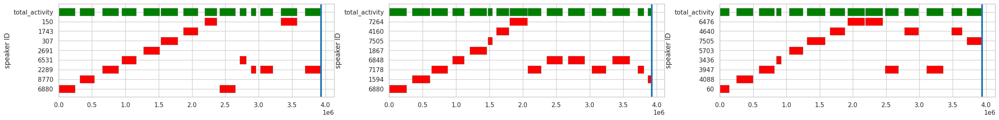

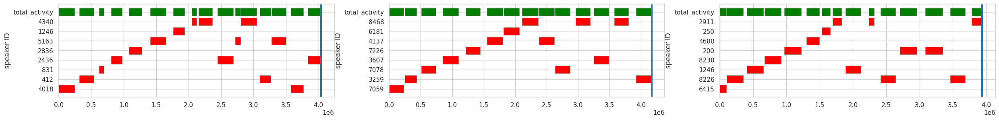

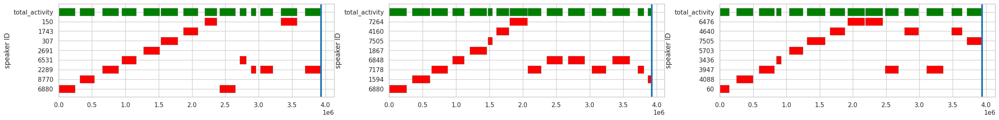

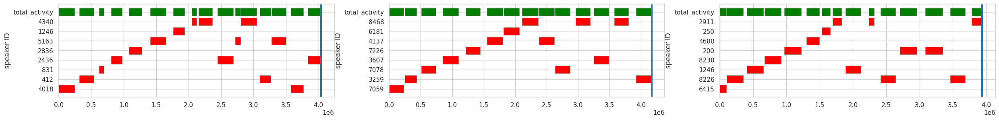

In [8]:
plot_mixtures(ds)

In [10]:
it = iter(ds)
ex = next(it)
ex = next(it)
pb.io.play(ex['audio_data']['observation'][0])

In [15]:
ex['num_samples']

3926237

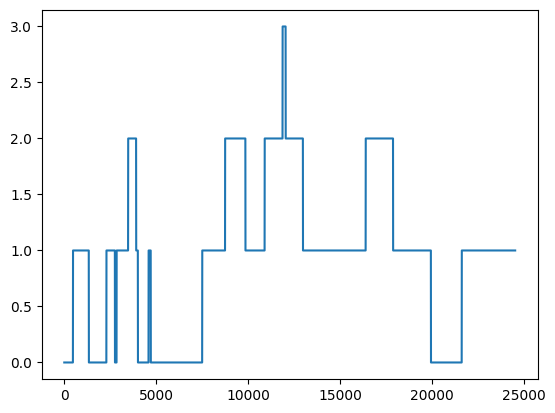

In [11]:
import numpy as np
import matplotlib.pyplot as plt
activity_noise = np.zeros(ex['_num_samples']['observation']//160*160)
for o,n in zip(ex['offset']['noise'], ex['_num_samples']['noise']):
    activity_noise[o:o+n] +=1
plt.plot(activity_noise.reshape(-1, 160).max(-1))

In [12]:
ex.keys()

dict_keys(['activity', 'audio_path', 'chapter_id', 'dataset', 'example_id', 'gender', 'kaldi_transcription', 'log_weights', 'noise_log_weights', 'num_samples', 'num_speakers', 'offset', 'room_dimensions', 'scenario', 'sensor_position', 'snr', 'sound_decay_time', 'source_dataset', 'source_id', 'source_position', 'speaker_id', 'audio_data', 'rir', '_num_samples'])

In [13]:
from paderbox.array.interval.core import ArrayInterval_from_str
activity = ArrayInterval_from_str(*ex['activity'])

In [14]:
from paderbox.transform import STFT
from paderbox.visualization.plot import stft as plot_stft
import matplotlib.pyplot as plt
stft = STFT(shift=160, size=400)

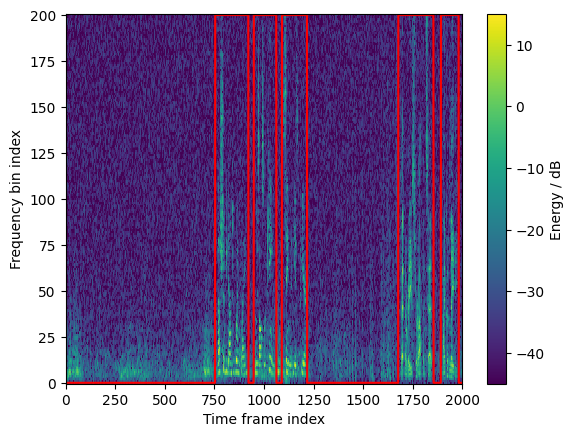

In [15]:
import numpy as np
sig_len = 16000*20
obs = ex['audio_data']['observation'][0]
plot_stft(stft(obs[-sig_len:]))
plt.plot(stft.window_length//2*np.reshape(activity[-sig_len:], (-1, stft.shift)).max(-1), color='red')
plt.show()

In [18]:
pb.io.play("/net/db/musan/noise/free-sound/noise-free-sound-0423.wav")